## Detecção de Incêndios Florestais utilizando Redes Neurais Convolucionais

<img src="https://media2.giphy.com/media/RuhIAu5P0LO7u/giphy.gif?cid=ecf05e47qr2jh7mh57dfnvvct3bdqwxj2y4cb5tat96kufvr&rid=giphy.gif&ct=g" width="480" align="center">


### Informações sobre o Dataset:

- Os dados foram coletados para treinar modelos para distinguir entre as imagens que contêm fogo (imagens de fogo) e imagens regulares (imagens que não são de fogo), então todo o problema é de classificação binária.


###### Dataset de treinamento, validação e teste (Ali-Khan):

- Os dados são divididos em 2 pastas: ``training_set`` e ``test_set``. Ambas as pastas contém uma pasta ``fire`` que contém imagens de fogo ao ar livre, já a pasta ``nofire`` contém imagens da natureza (por exemplo: florestas, árvores, gramas, rios, lagos, animais e cachoeiras). Ambas as pastas possuem 1520 imagens para treinamento e 380 imagens para teste.

Referências: 

- Khan, Ali; Hassan, Bilal (2020), “Dataset for Forest Fire Detection”, Mendeley Data

Disponível em: https://data.mendeley.com/datasets/gjmr63rz2r/1


###### Dataset de teste (kaggle):

- Os dados são divididos em 2 pastas, a pasta ``fire`` contém 755 imagens de fogo ao ar livre, algumas delas contendo fumaça, já a pasta ``nofire`` não são imagens de fogo que contém 244 imagens da natureza (por exemplo: florestas, árvores, gramas, rios, lagos, animais e cachoeiras). Ambas as pastas possuem 998 imagens para teste.

Referências: 

- Saied, Ahmed; (2020), “Outdoor-fire images and non-fire images for computer vision tasks”, Kaggle

Disponível em: https://www.kaggle.com/phylake1337/fire-dataset

## 1. Importações das bibliotecas

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import os
import os.path
from pathlib import Path
import glob
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization, GlobalAveragePooling2D, SpatialDropout2D
from tensorflow.keras import layers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, classification_report, recall_score, precision_score, f1_score, roc_auc_score, roc_curve
from tensorflow.keras.preprocessing import image
from PIL import Image

## 2. Organizando os Dataframes de treinamento, teste 1 e teste 2

In [2]:
# Selecionando os caminhos das pastas de trainingset1

dir_ = Path('../input/forest-fire-detection/Dataset/Dataset/training_set_khan')
# dir_ = Path('Dataset/training_set_khan')
train_filepaths = list(dir_.glob(r'**/*.jpg'))

# Mapeando as labels
labels_training = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], train_filepaths))

# Caminhos & labels de treino
train_filepaths = pd.Series(train_filepaths, name = 'File').astype(str)
train_labels = pd.Series(labels_training, name='Label')

# Concatenando ambos...
trainset_df = pd.concat([train_filepaths, train_labels], axis=1)

In [3]:
# Selecionando os caminhos das pastas de testset1

dir_ = Path('../input/forest-fire-detection/Dataset/Dataset/test_set_khan')
# dir_ = Path('Dataset/test_set_khan')
test_filepaths = list(dir_.glob(r'**/*.jpg'))

# Mapeando as labels
labels_test = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], test_filepaths))

# Caminhos & labels de teste
test_filepaths = pd.Series(test_filepaths, name = 'File').astype(str)
test_labels = pd.Series(labels_test, name='Label')

# Concatenando ambos...
testset1_df = pd.concat([test_filepaths, test_labels], axis=1)

In [4]:
# Selecionando os caminhos das pastas de testset2

dir_ = Path('../input/forest-fire-detection/Dataset/Dataset/test_set_kaggle')
# dir_ = Path('Dataset/test_set_kaggle')
test_filepaths = list(dir_.glob(r'**/*.png'))

# Mapeando as labels
labels_test = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], test_filepaths))

# Caminhos & labels de teste
test_filepaths = pd.Series(test_filepaths, name = 'File').astype(str)
test_labels = pd.Series(labels_test, name='Label')

# Concatenando ambos...
testset2_df = pd.concat([test_filepaths, test_labels], axis=1)

In [5]:
# Visualizando os dados no dataset de treinamento (trainingset)
print('Dataset de treinamento:')

print(f'Número de imagens: {trainset_df.shape[0]}')

print(f'Número de imagens com fogo: {trainset_df["Label"].value_counts()[0]}')
print(f'Número de imagens sem fogo: {trainset_df["Label"].value_counts()[1]}\n')
      
# Visualizando os dados em ambos datasets (testset1 & testset2)
print('Dataset de teste (Khan):')
      
print(f'Número de imagens no dataset de teste: {testset1_df.shape[0]}')
print(f'Número de imagens com fogo: {testset1_df["Label"].value_counts()[0]}')
print(f'Número de imagens sem fogo: {testset1_df["Label"].value_counts()[1]}')

print('\nDataset de teste (Kaggle):')
      
print(f'Número de imagens no dataset de teste: {testset2_df.shape[0]}')
print(f'Número de imagens com fogo: {testset2_df["Label"].value_counts()[0]}')
print(f'Número de imagens sem fogo: {testset2_df["Label"].value_counts()[1]}')

Dataset de treinamento:
Número de imagens: 1520
Número de imagens com fogo: 760
Número de imagens sem fogo: 760

Dataset de teste (Khan):
Número de imagens no dataset de teste: 380
Número de imagens com fogo: 190
Número de imagens sem fogo: 190

Dataset de teste (Kaggle):
Número de imagens no dataset de teste: 998
Número de imagens com fogo: 755
Número de imagens sem fogo: 243


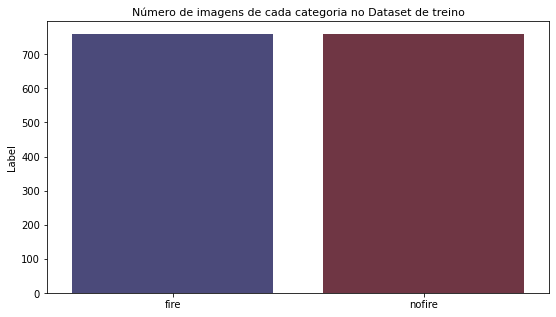

In [6]:
# Visualizando os dados do dataset de treinamento em um barplot
vc = trainset_df['Label'].value_counts()
plt.figure(figsize = (9, 5))
sns.barplot(x = vc.index, y = vc, palette = "icefire")
plt.title("Número de imagens de cada categoria no Dataset de treino", fontsize = 11)
plt.show()

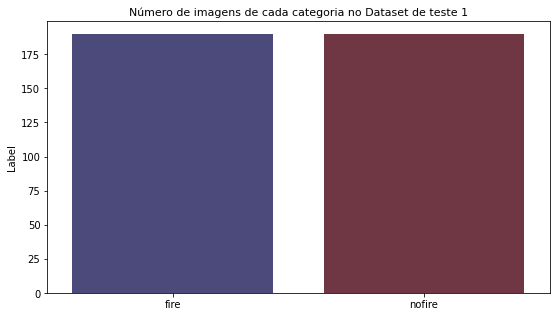

In [7]:
# Visualizando os dados do dataset de teste 1 em um barplot
vc = testset1_df['Label'].value_counts()
plt.figure(figsize = (9, 5))
sns.barplot(x = vc.index, y = vc, palette = "icefire")
plt.title("Número de imagens de cada categoria no Dataset de teste 1", fontsize = 11)
plt.show()

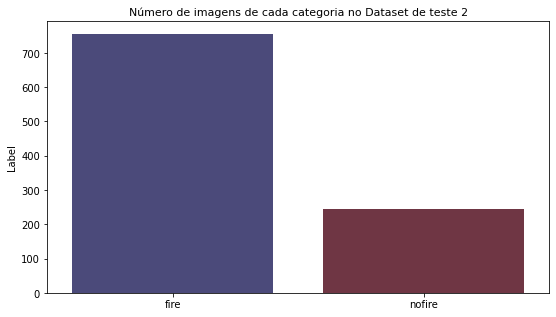

In [8]:
# Visualizando os dados do dataset de teste 2 em um barplot
vc = testset2_df['Label'].value_counts()
plt.figure(figsize = (9, 5))
sns.barplot(x = vc.index, y = vc, palette = "icefire")
plt.title("Número de imagens de cada categoria no Dataset de teste 2", fontsize = 11)
plt.show()

Podemos observar que os datasets de treinamento e teste (testset1) estão balanceados, porém o de teste 2 (teset2) está desbalanceado, por isso iremos utiliza-lo apenas para o teste dos modelos.

In [9]:
# Misturando os dataframes e resetando o index
trainset_df = trainset_df.sample(frac = 1, random_state = 1).reset_index(drop = True)
testset1_df = testset1_df.sample(frac = 1, random_state = 2).reset_index(drop = True)
testset2_df = testset2_df.sample(frac = 1, random_state = 3).reset_index(drop = True)

# Resultado
display(trainset_df.head())

display(testset1_df.head())

testset2_df.head()

,File,Label
0,../input/forest-fire-detection/Dataset/Dataset...,fire
1,../input/forest-fire-detection/Dataset/Dataset...,nofire
2,../input/forest-fire-detection/Dataset/Dataset...,fire
3,../input/forest-fire-detection/Dataset/Dataset...,fire
4,../input/forest-fire-detection/Dataset/Dataset...,fire


,File,Label
0,../input/forest-fire-detection/Dataset/Dataset...,nofire
1,../input/forest-fire-detection/Dataset/Dataset...,nofire
2,../input/forest-fire-detection/Dataset/Dataset...,fire
3,../input/forest-fire-detection/Dataset/Dataset...,nofire
4,../input/forest-fire-detection/Dataset/Dataset...,fire


,File,Label
0,../input/forest-fire-detection/Dataset/Dataset...,fire
1,../input/forest-fire-detection/Dataset/Dataset...,fire
2,../input/forest-fire-detection/Dataset/Dataset...,fire
3,../input/forest-fire-detection/Dataset/Dataset...,nofire
4,../input/forest-fire-detection/Dataset/Dataset...,fire


In [10]:
# convertendo a Label para formato númerico para teste posteriormente
LE = LabelEncoder()

y_test1 = LE.fit_transform(testset1_df["Label"])

y_test2 = LE.fit_transform(testset2_df["Label"])

## 3. Observando as imagens

In [11]:
plt.style.use("dark_background")

###### Dataset de treinamento

Text(0.5, 1.0, 'fire')

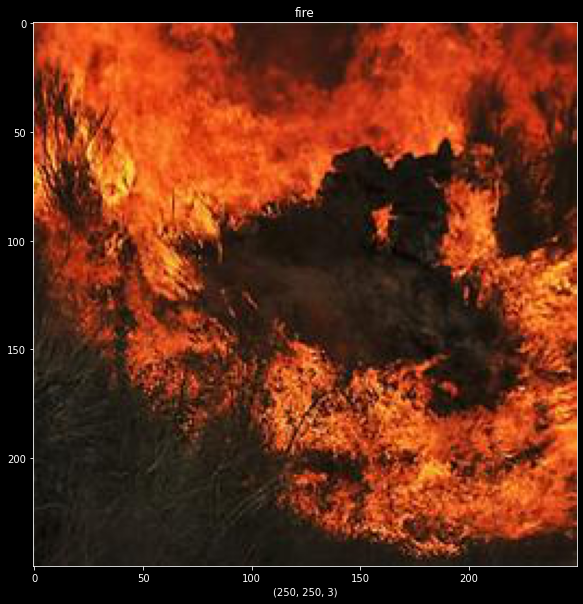

In [12]:
# Observando as imagens do dataset de treino
figure = plt.figure(figsize=(10, 10))
x = plt.imread(trainset_df["File"][11])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(trainset_df["Label"][11])

Text(0.5, 1.0, 'nofire')

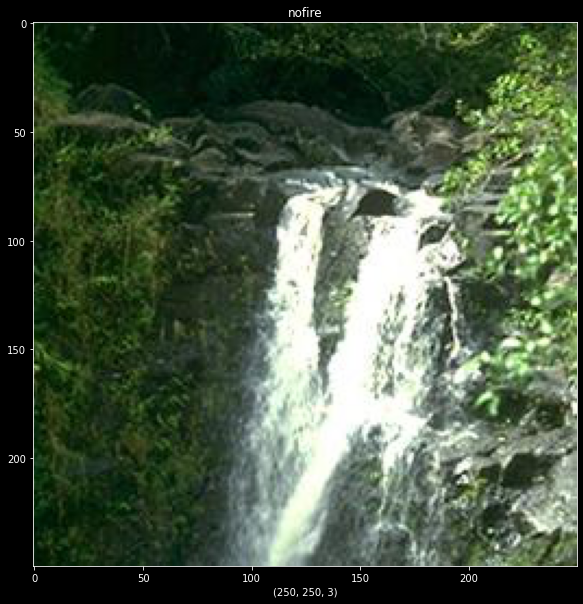

In [13]:
# Observando as imagens do dataset de treino
figure = plt.figure(figsize=(10,10))
x = plt.imread(trainset_df["File"][16])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(trainset_df["Label"][16])

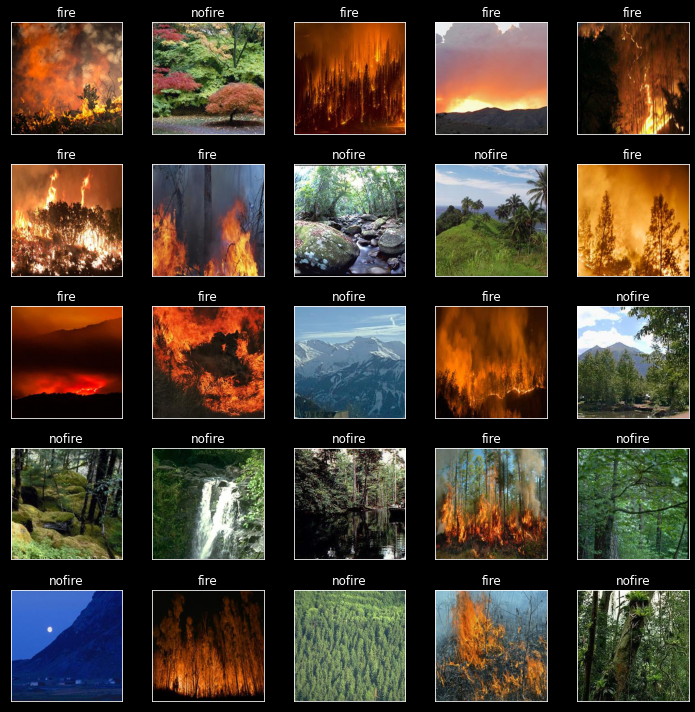

In [14]:
# Observando as imagens do dataset de treino
fig, axes = plt.subplots(nrows = 5,
                        ncols = 5,
                        figsize = (10,10),
                        subplot_kw = {"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(trainset_df["File"][i]))
    ax.set_title(trainset_df["Label"][i])
plt.tight_layout()
plt.show()

###### Dataset de teste 1

Text(0.5, 1.0, 'fire')

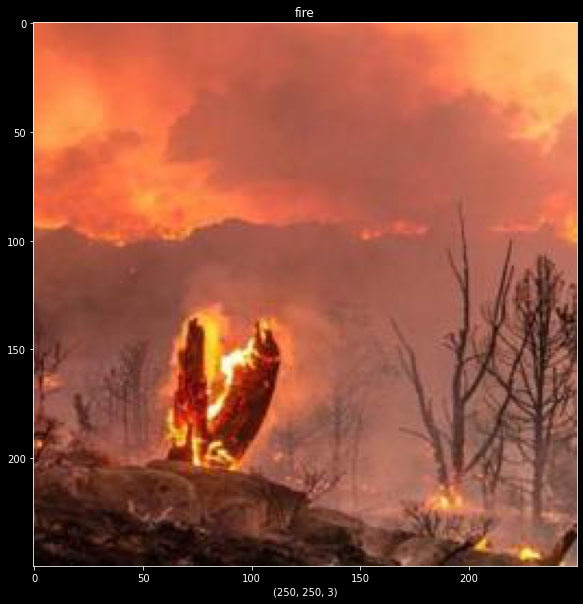

In [15]:
# Observando as imagens do dataset de teste 1
figure = plt.figure(figsize=(10,10))
x = plt.imread(testset1_df["File"][27])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(testset1_df["Label"][27])

Text(0.5, 1.0, 'nofire')

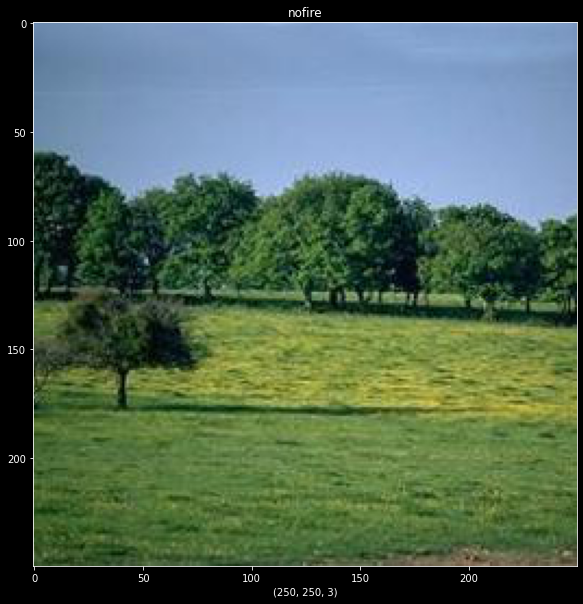

In [16]:
# Observando as imagens do dataset de teste 1
figure = plt.figure(figsize=(10,10))
x = plt.imread(testset1_df["File"][26])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(testset1_df["Label"][26])

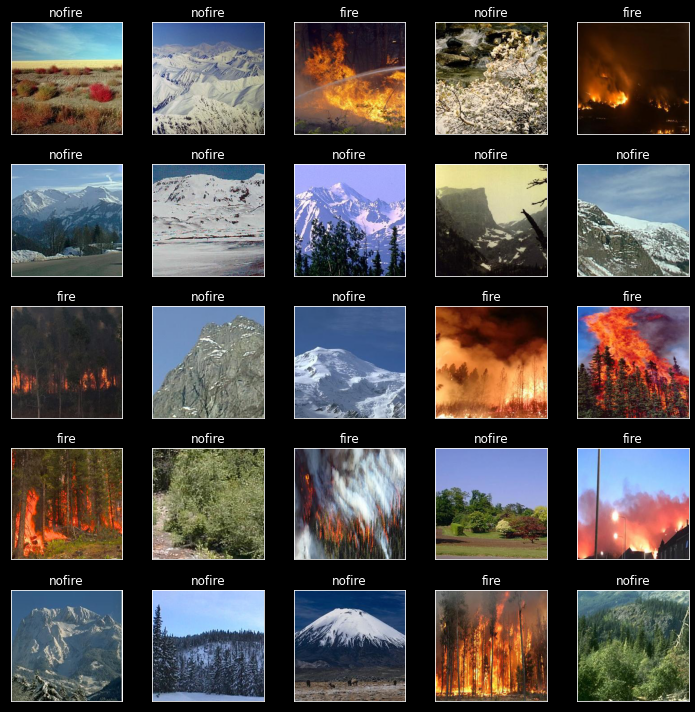

In [17]:
# Observando as imagens do dataset de teste 1
fig, axes = plt.subplots(nrows = 5,
                        ncols = 5,
                        figsize = (10,10),
                        subplot_kw = {"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(plt.imread(testset1_df["File"][i]))
    ax.set_title(testset1_df["Label"][i])
plt.tight_layout()
plt.show()

###### Dataset de teste 2

Text(0.5, 1.0, 'fire')

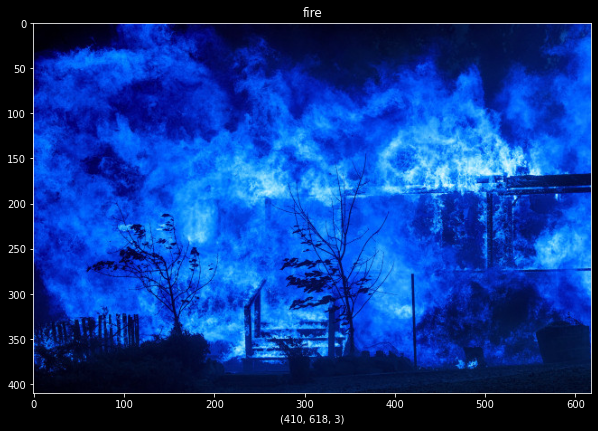

In [18]:
# Observando as imagens do dataset de teste 2
figure = plt.figure(figsize=(10,10))
x = cv2.imread(testset2_df["File"][11])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(testset2_df["Label"][11])

Text(0.5, 1.0, 'nofire')

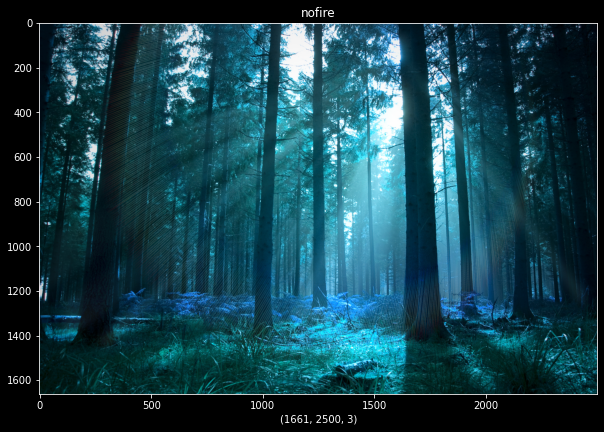

In [19]:
# Observando as imagens do dataset de teste 2
figure = plt.figure(figsize=(10,10))
x = cv2.imread(testset2_df["File"][3])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(testset2_df["Label"][3])

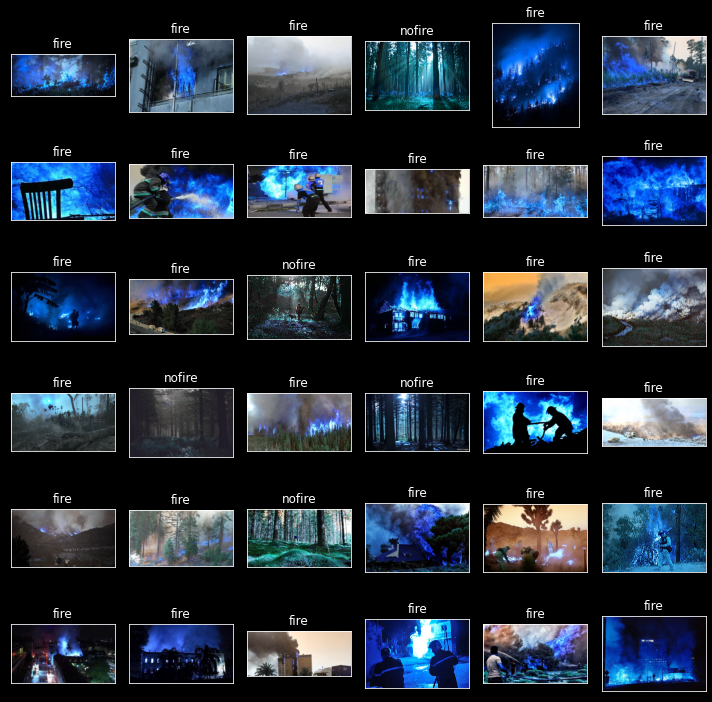

In [20]:
# Observando as imagens do dataset de teste 2
fig, axes = plt.subplots(nrows = 6,
                        ncols = 6,
                        figsize = (10,10),
                        subplot_kw = {"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(testset2_df["File"][i]))
    ax.set_title(testset2_df["Label"][i])
plt.tight_layout()
plt.show()

## 4. Geração de lotes das imagens

Nesta parte iremos fazer a geração de lotes de imagens aumentando os dados de treinamento, para a base de dados de teste iremos apenas fazer a normalização dos dados usando o [ImageDataGenerator](https://keras.io/api/preprocessing/image/#imagedatagenerator-class)

Paramêtros do ``ImageDataGenerator``:

    rescale - Transforma o tamanho da imagem (normalização dos dados)
    shear_range - Transformações geometricas aleatórias
    zoom_range - Imagens que serão aplicadas o zoom
    brightness_range - Grau da mudança do brilho (tupla ou lista)
    rotation_range - grau da rotação da imagem
    width_shift_range - Faixa da mudança da altura da imagem
    height_shift_range - Faixa da mudança da largura da imagem
    horizontal_flip - Girar as imagens horizontalmente
    vertical_flip - Girar as imagens verticalmente
    validation_split - Imagens que ficaram reservadas para validação (0-1)

In [21]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                    shear_range = 0.2,
                                    zoom_range = 0.1,
                                    rotation_range = 20,
                                    width_shift_range = 0.1,
                                    height_shift_range = 0.1,
                                    horizontal_flip = True,
                                    vertical_flip = True,
                                    validation_split = 0.2)

test_datagen = ImageDataGenerator(rescale = 1./255)

## 5. Diretório das imagens de treinamento, validação e teste

Aqui fazemos a divisão das bases de imagens para treinamento, validação e teste do modelo, para isso usamos o [flow_from_dataframe](https://keras.io/api/preprocessing/image/#flowfromdataframe-method)

Paramêtros do ``flow_from_directory``:

    dataframe - Dataframe contendo o diretório da imagem
    x_col - Nome da coluna contendo o diretório das imagens
    y_col - Nome da coluna contendo oque queremos prever
    target_size - tamanho das imagens (lembrando que deve ser do mesmo tamanho da camada de entrada)
    color_mode - Padrão de cores RGB
    class_mode - modo da classe binário (Fire/No Fire)
    batch_size - tamanho do batch
    shuffle - Embaralhar os dados 
    seed - semente aleatória opcional para o shuffle
    subset - Subset dos dados sendo training e validation (apenas usado caso use validation_split no ImageDataGenerator) 

In [22]:
print("Preparando o dataset de treino...")
training_set = train_datagen.flow_from_dataframe(
    dataframe = trainset_df,
    x_col = "File",
    y_col = "Label",
    target_size = (250, 250),
    color_mode = "rgb",
    class_mode = "binary",
    batch_size = 32,
    shuffle = True,
    seed = 1,
    subset = "training")

print("Preparando o dataset de validação...")
validation_set = train_datagen.flow_from_dataframe(
    dataframe = trainset_df,
    x_col = "File",
    y_col = "Label",
    target_size = (250, 250),
    color_mode ="rgb",
    class_mode = "binary",
    batch_size = 32,
    shuffle = True,
    seed = 1,
    subset = "validation")

print("Preparando o dataset de teste 1...")
test_set1 = test_datagen.flow_from_dataframe(
    dataframe = testset1_df,
    x_col = "File",
    y_col = "Label",
    target_size = (250, 250),
    color_mode ="rgb",
    class_mode = "binary",
    shuffle = False,
    batch_size = 32)

print("Preparando o dataset de teste 2...")
test_set2 = test_datagen.flow_from_dataframe(
    dataframe = testset2_df,
    x_col = "File",
    y_col = "Label",
    target_size = (250, 250),
    color_mode ="rgb",
    class_mode = "binary",
    shuffle = False,
    batch_size = 32)

print('Geradores de dados prontos!')

Preparando o dataset de treino...
Found 1216 validated image filenames belonging to 2 classes.
Preparando o dataset de validação...
Found 304 validated image filenames belonging to 2 classes.
Preparando o dataset de teste 1...
Found 380 validated image filenames belonging to 2 classes.
Preparando o dataset de teste 2...
Found 998 validated image filenames belonging to 2 classes.
Geradores de dados prontos!


In [23]:
print("Treinamento: ")
print(training_set.class_indices)
print(training_set.image_shape)
print("---" * 8)
print("Validação: ")
print(validation_set.class_indices)
print(validation_set.image_shape)
print("---" * 8)
print("Teste 1: ")
print(test_set1.class_indices)
print(test_set1.image_shape)
print("---" * 8)
print("Teste 2: ")
print(test_set2.class_indices)
print(test_set2.image_shape)

Treinamento: 
{'fire': 0, 'nofire': 1}
(250, 250, 3)
------------------------
Validação: 
{'fire': 0, 'nofire': 1}
(250, 250, 3)
------------------------
Teste 1: 
{'fire': 0, 'nofire': 1}
(250, 250, 3)
------------------------
Teste 2: 
{'fire': 0, 'nofire': 1}
(250, 250, 3)


Uso do callbacks para monitorar os modelos e observar se as métricas serão melhoradas, caso não for o treinamento é interrompido.

Parâmetros do ``EarlyStopping``:

    monitor - Métrica que irá ser monitorada
    patience - Número de épocas sem melhoras no modelo, após estas épocas o treinamento é interrompido
    restore_best_weights - Restaura os melhores pesos caso o treinamento seja interrompido

In [24]:
cb = [EarlyStopping(monitor = 'loss', mode = 'min', patience = 25, restore_best_weights = True)]

## 8. Construção do primeiro modelo (ConvNet)

[CNNs](https://www.tensorflow.org/tutorials/images/cnn) são um tipo específico de rede neural artificial bastante eficaz para classificação de imagens pois são capazes de levar em consideração a coerência espacial da imagem, ou seja, que pixels próximos uns dos outros estão frequentemente relacionados.

<p><img src = "https://i.ibb.co/0jWhFsW/ConvNet.png" alt></p>

###### Etapa 1 - Convolution
Detector de Características e Mapa de Características

    Número de filtros (32)
    Dimensões do detector de características (3, 3)
    Definição da altura/largura e canais RGB (250, 250, 3)
    Função de ativação para retirar os valores negativos da imagem - 'relu'
    Aceleração do processamento - BatchNormalization

In [25]:
CNN = Sequential()

CNN.add(Conv2D(32, (3, 3), input_shape = (250, 250, 3), activation = 'relu'))

###### Etapa 2 - Max Pooling
Redução do tamanho da imagem focando nas caracteristicas mais importantes

    Definição da matriz com o total de 4 pixels (2, 2)

In [26]:
CNN.add(MaxPooling2D(pool_size = (2, 2)))

###### Etapa 3 - Camadas ocultas

In [27]:
CNN.add(Conv2D(32, (3, 3), activation = 'relu'))
CNN.add(MaxPooling2D(pool_size = (2, 2)))

In [28]:
CNN.add(Conv2D(64, (3, 3), activation = 'relu'))
CNN.add(SpatialDropout2D(0.2))
CNN.add(MaxPooling2D(pool_size = (2, 2)))

###### Etapa 4 - Flattening
    
    Transformação da matriz para um vetor para entrar na camada da Rede Neural Artificial

In [29]:
CNN.add(Flatten())

###### Etapa 5 - Redes Neurais Densas

Parâmetros da ``RNA``:

    Dense - Todos os neurônios conectados
    units - Quantidade de neurônios que fazem parte da camada oculta
    activation - Função de ativação que será inserida
    Dropout - é usado para diminuir a chance de overfitting (40% dos neurônios de entrada são zerados)

In [30]:
# Camada de entrada
CNN.add(Dense(units = 128, activation = 'relu'))
CNN.add(Dropout(0.2))
# Camada de saida (classificação binária)
CNN.add(Dense(units = 1, activation = 'sigmoid'))

print(CNN.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 248, 248, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 124, 124, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 122, 122, 32)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 61, 61, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 59, 59, 64)        18496     
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 59, 59, 64)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 29, 29, 64)        0

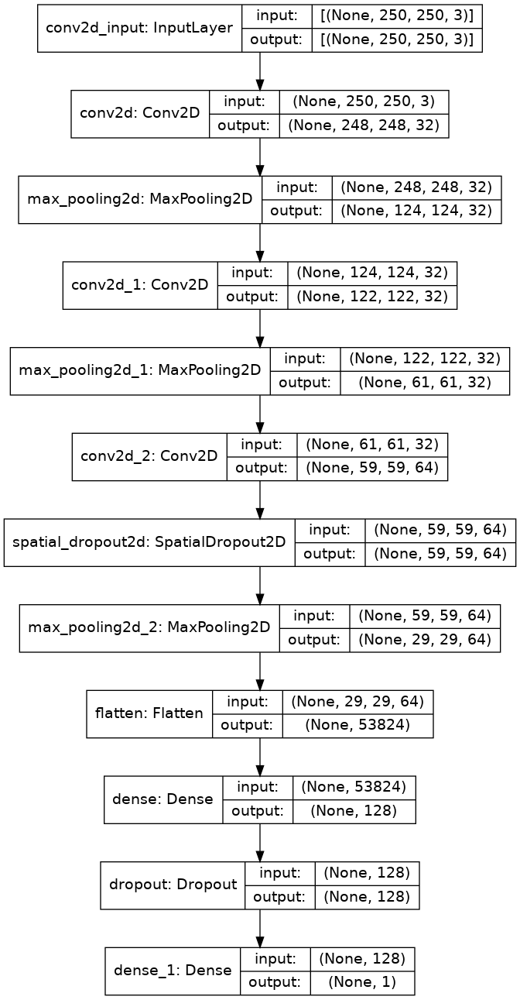

In [31]:
plot_model(CNN, show_layer_names = True , show_shapes = True)

###### Etapa 6 - Compilação e treinamento do modelo

Agora que especificamos a arquitetura do modelo, iremos compilar o modelo para treinamento. Para isso, precisamos especificar a função de perda (o que estamos tentando minimizar), o otimizador (como queremos fazer para minimizar a perda) e a métrica (como julgaremos o desempenho do modelo). Em seguida, chamaremos .fit para iniciar o treinamento do processo.

Parâmetros do ``compile``:

    optimizer - descida do gradiente e descida do gradiente estocástica
    loss - Função de perda (binary_crossentropy pois só há uma saída)
    metrics - Métrica de avaliação (obs - pode ser colocado mais de um)

Paramêtros do ``fit``:

    train_data - base de dados de treinamento
    epochs - número de épocas
    validation_data - base de dados de teste
    callbacks - Utilização do EarlyStopping
    validation_steps - número de imagens para teste

In [32]:
# Compilação
CNN.compile(optimizer='adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Inicio da contagem do tempo
start = dt.datetime.now()

# Treinamento
CNN_model = CNN.fit(training_set, epochs = 250, validation_data = validation_set, callbacks = cb)

# Fim da Contagem do tempo
end = dt.datetime.now()
time_CNN = end - start
print ('\nTempo de treinamento e validação: ', time_CNN)

Epoch 1/250
38/38 [==============================] - 29s 630ms/step - loss: 0.4971 - accuracy: 0.7609 - val_loss: 0.3157 - val_accuracy: 0.8684
Epoch 2/250
38/38 [==============================] - 20s 525ms/step - loss: 0.2195 - accuracy: 0.9128 - val_loss: 0.1284 - val_accuracy: 0.9572
Epoch 3/250
38/38 [==============================] - 20s 531ms/step - loss: 0.1425 - accuracy: 0.9554 - val_loss: 0.1895 - val_accuracy: 0.9178
Epoch 4/250
38/38 [==============================] - 20s 517ms/step - loss: 0.1792 - accuracy: 0.9401 - val_loss: 0.1163 - val_accuracy: 0.9671
Epoch 5/250
38/38 [==============================] - 20s 526ms/step - loss: 0.1571 - accuracy: 0.9547 - val_loss: 0.1323 - val_accuracy: 0.9704
Epoch 6/250
38/38 [==============================] - 19s 512ms/step - loss: 0.1420 - accuracy: 0.9620 - val_loss: 0.1153 - val_accuracy: 0.9704
Epoch 7/250
38/38 [==============================] - 20s 528ms/step - loss: 0.1146 - accuracy: 0.9547 - val_loss: 0.1127 - val_accuracy:

###### Etapa 7 - Histórico do treinamento do modelo

Podemos observar como a precisão melhora com o tempo, eventualmente se estabilizando. Correspondentemente, a perda diminui com o tempo. Parcelas como essas podem ajudar a diagnosticar o sobreajuste. Se tivéssemos visto uma curva ascendente na perda de validação com o passar do tempo (uma forma de U no gráfico), suspeitaríamos que o modelo estava começando a memorizar o conjunto de teste e não generalizaria bem para novos dados.

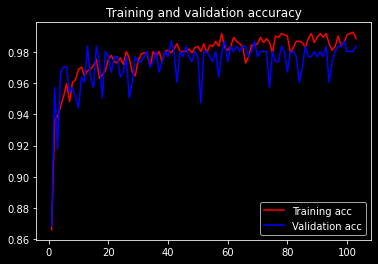

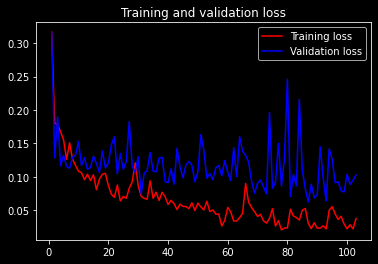

In [33]:
acc = CNN_model.history['accuracy']
val_acc = CNN_model.history['val_accuracy']
loss = CNN_model.history['loss']
val_loss = CNN_model.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')

plt.legend()

plt.show()

###### Etapa 8 - Gerando resultados para visualizarmos posteriormente

Conjunto de dados testset1

In [34]:
score_CNN1 = CNN.evaluate(test_set1)
print("Test Loss:", score_CNN1[0])
print("Test Accuracy:", score_CNN1[1])

12/12 [==============================] - 3s 220ms/step - loss: 0.3148 - accuracy: 0.9395
Test Loss: 0.3148174583911896
Test Accuracy: 0.9394736886024475


In [35]:
y_pred_CNN1 = CNN.predict(test_set1)
y_pred_CNN1 = np.round(y_pred_CNN1)

recall_CNN1 = recall_score(y_test1, y_pred_CNN1)
precision_CNN1 = precision_score(y_test1, y_pred_CNN1)
f1_CNN1 = f1_score(y_test1, y_pred_CNN1)
roc_CNN1 = roc_auc_score(y_test1, y_pred_CNN1)

In [36]:
print(classification_report(y_test1, y_pred_CNN1))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       190
           1       0.97      0.90      0.93       190

    accuracy                           0.94       380
   macro avg       0.94      0.94      0.94       380
weighted avg       0.94      0.94      0.94       380



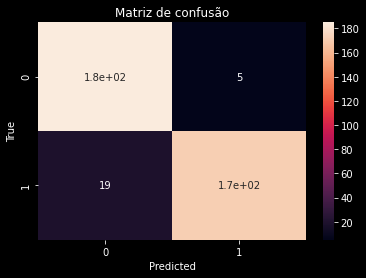

In [37]:
plt.figure(figsize = (6, 4))

sns.heatmap(confusion_matrix(y_test1, y_pred_CNN1), annot = True)
plt.title("Matriz de confusão")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.show()

Conjunto de dados testset2

In [38]:
score_CNN2 = CNN.evaluate(test_set2)
print("Test Loss:", score_CNN2[0])
print("Test Accuracy:", score_CNN2[1])

32/32 [==============================] - 38s 1s/step - loss: 0.2753 - accuracy: 0.9409
Test Loss: 0.27534738183021545
Test Accuracy: 0.9408817887306213


In [39]:
y_pred_CNN2 = CNN.predict(test_set2)
y_pred_CNN2 = np.round(y_pred_CNN2)

recall_CNN2 = recall_score(y_test2, y_pred_CNN2)
precision_CNN2 = precision_score(y_test2, y_pred_CNN2)
f1_CNN2 = f1_score(y_test2, y_pred_CNN2)
roc_CNN2 = roc_auc_score(y_test2, y_pred_CNN2)

In [40]:
print(classification_report(y_test2, y_pred_CNN2))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       755
           1       0.87      0.87      0.87       243

    accuracy                           0.94       998
   macro avg       0.92      0.92      0.92       998
weighted avg       0.94      0.94      0.94       998



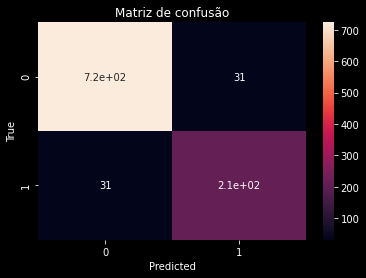

In [41]:
plt.figure(figsize = (6, 4))

sns.heatmap(confusion_matrix(y_test2, y_pred_CNN2), annot = True)
plt.title("Matriz de confusão")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.show()

Salvando o modelo

In [42]:
modelFileName = 'fire_classifier_model-convnet.h5'
CNN.save(modelFileName)
print('model saved as', modelFileName)

model saved as fire_classifier_model-convnet.h5


## 9. Construção do segundo modelo (Inception)

O modelo [InceptionV3](https://keras.io/api/applications/inceptionv3/) proposto por Szegedy et al. (2015), é uma arquitetura de CNN que busca a resolução de diversos problemas de reconhecimento de imagens em grande escala e também podem ser utilizados em problemas de transfer learning (descrito anteriormente). O seu diferencial é a presença de módulos extratores de características convolucionais. Estes módulos tem como funcionalidade aprender com  menos parâmetros que contém uma maior gama de informação.

<p><img src = "https://cloud.google.com/tpu/docs/images/inceptionv3onc--oview.png?hl=pt-br" alt></p>

###### Etapa 1 - Criação do modelo base

    input_shape - Definição da altura/largura e canais RGB (250, 250, 3)
    include_top - A camada totalmente conectada não vai ser incluida no topo
    weights - Pré-treinamento utilizando imagenet

In [43]:
CNN_base_inc = InceptionV3(input_shape = (250, 250, 3), include_top = False, weights = 'imagenet')

87916544/87910968 [==============================] - 1s 0us/step


In [44]:
for layer in CNN_base_inc.layers:
    layer.trainable = False

###### Etapa 2 - Flattening
    
    Transformação da matriz para um vetor para entrar na camada da Rede Neural Artificial

In [45]:
x = layers.Flatten()(CNN_base_inc.output)

###### Etapa 3 - Redes Neurais Densas

Parâmetros da ``RNA``:

    Dense - Todos os neurônios conectados
    units - Quantidade de neurônios que fazem parte da camada oculta
    activation - Função de ativação que será inserida
    Dropout - é usado para diminuir a chance de overfitting (40% dos neurônios de entrada são zerados)

In [46]:
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.1)(x)
x = layers.Dense(1, activation='sigmoid')(x)

CNN_inc = Model(CNN_base_inc.input, x)

print(CNN_inc.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 250, 250, 3) 0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 124, 124, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 124, 124, 32) 96          conv2d_3[0][0]                   
__________________________________________________________________________________________________
activation (Activation)         (None, 124, 124, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [47]:
plot_model(CNN_inc, show_layer_names = True , show_shapes = True)

###### Etapa 4 - Compilação e treinamento do modelo

Agora que especificamos a arquitetura do modelo, iremos compilar o modelo para treinamento. Para isso, precisamos especificar a função de perda (o que estamos tentando minimizar), o otimizador (como queremos fazer para minimizar a perda) e a métrica (como julgaremos o desempenho do modelo). Em seguida, chamaremos .fit para iniciar o treinamento do processo.

Parâmetros do ``compile``:

    optimizer - descida do gradiente e descida do gradiente estocástica
    loss - Função de perda (binary_crossentropy pois só há uma saída)
    metrics - Métrica de avaliação (obs - pode ser colocado mais de um)

Paramêtros do ``fit``:

    train_data - base de dados de treinamento
    epochs - número de épocas
    validation_data - base de dados de teste
    callbacks - Utilização do EarlyStopping

In [48]:
# Compilação
CNN_inc.compile(optimizer = RMSprop(lr = 0.0001), loss = 'binary_crossentropy', metrics = ['accuracy'])

# Inicio da contagem do tempo
start = dt.datetime.now()

# Treinamento e validação
CNN_inc_history = CNN_inc.fit(training_set, epochs = 250, validation_data = validation_set, callbacks = cb)

# Fim da Contagem do tempo
end = dt.datetime.now()
time_CNN_inc = end - start
print ('\nTempo de treinamento e validação: ', time_CNN_inc)

Epoch 1/250
38/38 [==============================] - 25s 546ms/step - loss: 2.4309 - accuracy: 0.7769 - val_loss: 0.0775 - val_accuracy: 0.9770
Epoch 2/250
38/38 [==============================] - 20s 521ms/step - loss: 0.1030 - accuracy: 0.9650 - val_loss: 0.1365 - val_accuracy: 0.9572
Epoch 3/250
38/38 [==============================] - 20s 517ms/step - loss: 0.0844 - accuracy: 0.9774 - val_loss: 0.0872 - val_accuracy: 0.9836
Epoch 4/250
38/38 [==============================] - 19s 502ms/step - loss: 0.0798 - accuracy: 0.9823 - val_loss: 0.0744 - val_accuracy: 0.9868
Epoch 5/250
38/38 [==============================] - 20s 520ms/step - loss: 0.0548 - accuracy: 0.9796 - val_loss: 0.0780 - val_accuracy: 0.9836
Epoch 6/250
38/38 [==============================] - 19s 506ms/step - loss: 0.1202 - accuracy: 0.9720 - val_loss: 0.0859 - val_accuracy: 0.9638
Epoch 7/250
38/38 [==============================] - 20s 512ms/step - loss: 0.0560 - accuracy: 0.9851 - val_loss: 0.1035 - val_accuracy:

###### Etapa 5 - Histórico do treinamento do modelo

Podemos observar como a precisão melhora com o tempo, eventualmente se estabilizando. Correspondentemente, a perda diminui com o tempo. Parcelas como essas podem ajudar a diagnosticar o sobreajuste. Se tivéssemos visto uma curva ascendente na perda de validação com o passar do tempo (uma forma de U no gráfico), suspeitaríamos que o modelo estava começando a memorizar o conjunto de teste e não generalizaria bem para novos dados.

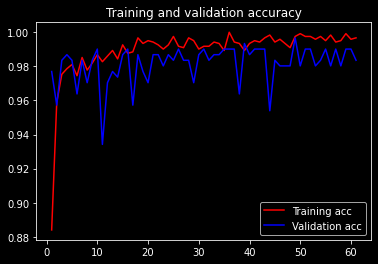

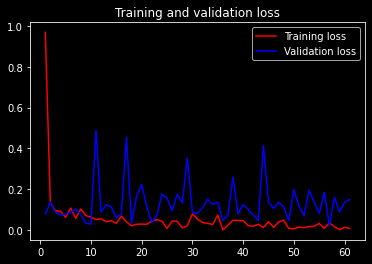

In [49]:
acc = CNN_inc_history.history['accuracy']
val_acc = CNN_inc_history.history['val_accuracy']
loss = CNN_inc_history.history['loss']
val_loss = CNN_inc_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')

plt.legend()

plt.show()

###### Etapa 6 - Gerando resultados para visualizarmos posteriormente

Conjunto de dados testset1

In [50]:
score_inc1 = CNN_inc.evaluate(test_set1)
print("Test Loss:", score_inc1[0])
print("Test Accuracy:", score_inc1[1])

12/12 [==============================] - 2s 126ms/step - loss: 0.1715 - accuracy: 0.9789
Test Loss: 0.17154541611671448
Test Accuracy: 0.9789473414421082


In [51]:
y_pred_inc1 = CNN_inc.predict(test_set1)
y_pred_inc1 = np.round(y_pred_inc1)

recall_inc1 = recall_score(y_test1, y_pred_inc1)
precision_inc1 = precision_score(y_test1, y_pred_inc1)
f1_inc1 = f1_score(y_test1, y_pred_inc1)
roc_inc1 = roc_auc_score(y_test1, y_pred_inc1)

Conjunto de dados testset2

In [52]:
score_inc2 = CNN_inc.evaluate(test_set2)
print("Test Loss:", score_inc2[0])
print("Test Accuracy:", score_inc2[1])

32/32 [==============================] - 27s 825ms/step - loss: 0.5758 - accuracy: 0.9349
Test Loss: 0.5758410692214966
Test Accuracy: 0.9348697662353516


In [53]:
y_pred_inc2 = CNN_inc.predict(test_set2)
y_pred_inc2 = np.round(y_pred_inc2)

recall_inc2 = recall_score(y_test2, y_pred_inc2)
precision_inc2 = precision_score(y_test2, y_pred_inc2)
f1_inc2 = f1_score(y_test2, y_pred_inc2)
roc_inc2 = roc_auc_score(y_test2, y_pred_inc2)

Salvando o modelo

In [54]:
modelFileName = 'fire_classifier_model-inc.h5'
CNN_inc.save(modelFileName)
print('model saved as', modelFileName)

model saved as fire_classifier_model-inc.h5


## 10. Construção do terceiro modelo (Xception)
O modelo [Xception](https://www.tensorflow.org/api_docs/python/tf/keras/applications/Xception) proposto por Chollet et al.(2016), é uma arquitetura de CNN similar ao Inception descrito anteriormente e, tem como diferencial que os módulos de iniciação foram substituidos por convoluções separáveis em profundidade. A Xception possui a mesma quantidade de parâmetros que o InceptionV3 com o total de 36 camadas convolucionais. Assim, tendo um uso mais eficiente dos parâmetros. 

<p><img src = "https://miro.medium.com/max/1688/1*J8dborzVBRBupJfvR7YhuA.png" alt></p>

###### Etapa 1 - Criação do modelo base

    input_shape - Definição da altura/largura e canais RGB (250, 250, 3)
    include_top - A camada totalmente conectada não vai ser incluida no topo
    weights - Pré-treinamento utilizando imagenet

In [55]:
CNN_base_xcep = Xception(input_shape = (250, 250, 3), include_top = False, weights = 'imagenet')
CNN_base_xcep.trainable = False

83689472/83683744 [==============================] - 2s 0us/step


###### Etapa 2 - Redes Neurais Densas

Parâmetros da ``RNA``:

    Dense - Todos os neurônios conectados
    units - Quantidade de neurônios que fazem parte da camada oculta
    activation - Função de ativação que será inserida
    Dropout - é usado para diminuir a chance de overfitting (40% dos neurônios de entrada são zerados)

In [56]:
CNN_xcep = Sequential()
CNN_xcep.add(CNN_base_xcep)
CNN_xcep.add(GlobalAveragePooling2D())
CNN_xcep.add(Dense(128))
CNN_xcep.add(Dropout(0.1))
CNN_xcep.add(Dense(1, activation = 'sigmoid'))

CNN_xcep.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 8, 8, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)               262272    
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 129       
Total params: 21,123,881
Trainable params: 262,401
Non-trainable params: 20,861,480
_________________________________________________________________


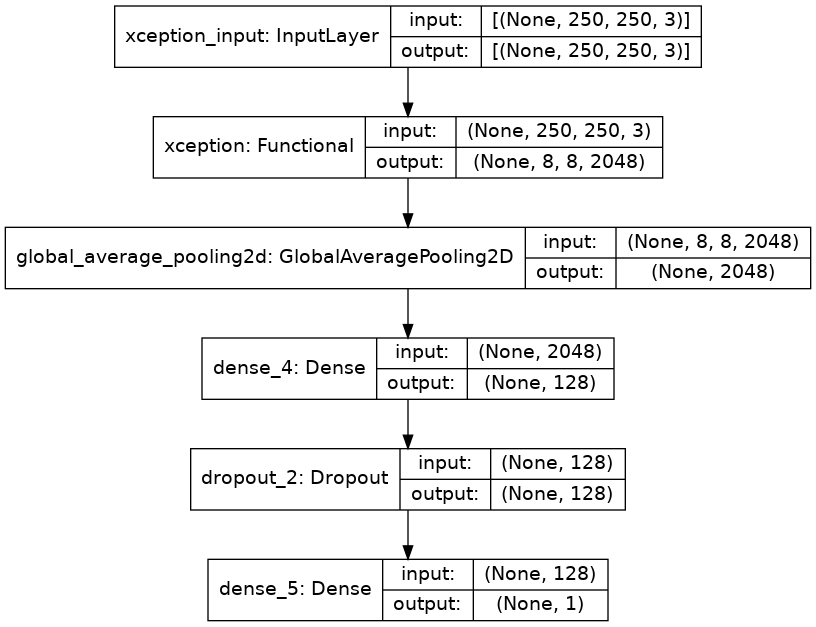

In [57]:
plot_model(CNN_xcep, show_layer_names = True , show_shapes = True)

###### Etapa 3 - Compilação e treinamento do modelo

Agora que especificamos a arquitetura do modelo, iremos compilar o modelo para treinamento. Para isso, precisamos especificar a função de perda (o que estamos tentando minimizar), o otimizador (como queremos fazer para minimizar a perda) e a métrica (como julgaremos o desempenho do modelo). Em seguida, chamaremos .fit para iniciar o treinamento do processo.

Parâmetros do ``compile``:

    optimizer - descida do gradiente e descida do gradiente estocástica
    loss - Função de perda (binary_crossentropy pois só há uma saída)
    metrics - Métrica de avaliação (obs - pode ser colocado mais de um)

Paramêtros do ``fit``:

    train_data - base de dados de treinamento
    epochs - número de épocas
    validation_data - base de dados de teste
    callbacks - Utilização do EarlyStopping

In [58]:
# Compilação
CNN_xcep.compile(optimizer='adam', loss = 'binary_crossentropy',metrics=['accuracy'])

# Inicio da contagem do tempo
start = dt.datetime.now()

# Treinamento e validação
CNN_xcep_history = CNN_xcep.fit(training_set, epochs = 250, validation_data = validation_set, callbacks = cb)

# Fim da Contagem do tempo
end = dt.datetime.now()
time_CNN_xcep = end - start
print ('\nTempo de treinamento e validação: ', time_CNN_xcep)

Epoch 1/250
38/38 [==============================] - 24s 562ms/step - loss: 0.1891 - accuracy: 0.9196 - val_loss: 0.0992 - val_accuracy: 0.9638
Epoch 2/250
38/38 [==============================] - 20s 528ms/step - loss: 0.0450 - accuracy: 0.9778 - val_loss: 0.0433 - val_accuracy: 0.9737
Epoch 3/250
38/38 [==============================] - 20s 520ms/step - loss: 0.0290 - accuracy: 0.9903 - val_loss: 0.0763 - val_accuracy: 0.9770
Epoch 4/250
38/38 [==============================] - 20s 521ms/step - loss: 0.0260 - accuracy: 0.9908 - val_loss: 0.1583 - val_accuracy: 0.9441
Epoch 5/250
38/38 [==============================] - 20s 530ms/step - loss: 0.1151 - accuracy: 0.9518 - val_loss: 0.0550 - val_accuracy: 0.9868
Epoch 6/250
38/38 [==============================] - 20s 520ms/step - loss: 0.0324 - accuracy: 0.9913 - val_loss: 0.0293 - val_accuracy: 0.9868
Epoch 7/250
38/38 [==============================] - 20s 535ms/step - loss: 0.0236 - accuracy: 0.9910 - val_loss: 0.0691 - val_accuracy:

###### Etapa 4 - Histórico do treinamento do modelo

Podemos observar como a precisão melhora com o tempo, eventualmente se estabilizando. Correspondentemente, a perda diminui com o tempo. Parcelas como essas podem ajudar a diagnosticar o sobreajuste. Se tivéssemos visto uma curva ascendente na perda de validação com o passar do tempo (uma forma de U no gráfico), suspeitaríamos que o modelo estava começando a memorizar o conjunto de teste e não generalizaria bem para novos dados.

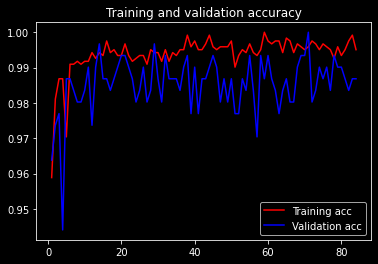

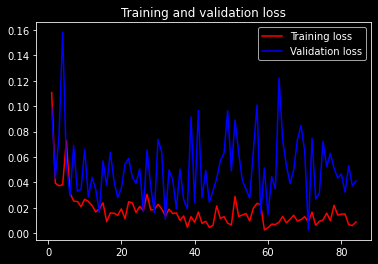

In [59]:
acc = CNN_xcep_history.history['accuracy']
val_acc = CNN_xcep_history.history['val_accuracy']
loss = CNN_xcep_history.history['loss']
val_loss = CNN_xcep_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')

plt.legend()

plt.show()

###### Etapa 5 - Gerando resultados para visualizarmos posteriormente

Conjunto de dados testset1

In [60]:
score_xcep1 = CNN_xcep.evaluate(test_set1)
print("Test Loss:", score_xcep1[0])
print("Test Accuracy:", score_xcep1[1])

12/12 [==============================] - 2s 124ms/step - loss: 0.0911 - accuracy: 0.9763
Test Loss: 0.09114672988653183
Test Accuracy: 0.9763157963752747


In [61]:
y_pred_xcep1 = CNN_xcep.predict(test_set1)
y_pred_xcep1 = np.round(y_pred_xcep1)

recall_xcep1 = recall_score(y_test1, y_pred_xcep1)
precision_xcep1 = precision_score(y_test1, y_pred_xcep1)
f1_xcep1 = f1_score(y_test1, y_pred_xcep1)
roc_xcep1 = roc_auc_score(y_test1, y_pred_xcep1)

Conjunto de dados testset2

In [62]:
score_xcep2 = CNN_xcep.evaluate(test_set2)
print("Test Loss:", score_xcep2[0])
print("Test Accuracy:", score_xcep2[1])

32/32 [==============================] - 27s 833ms/step - loss: 0.4159 - accuracy: 0.9339
Test Loss: 0.41587188839912415
Test Accuracy: 0.9338677525520325


In [63]:
y_pred_xcep2 = CNN_xcep.predict(test_set2)
y_pred_xcep2 = np.round(y_pred_xcep2)

recall_xcep2 = recall_score(y_test2, y_pred_xcep2)
precision_xcep2 = precision_score(y_test2, y_pred_xcep2)
f1_xcep2 = f1_score(y_test2, y_pred_xcep2)
roc_xcep2 = roc_auc_score(y_test2, y_pred_xcep2)

Salvando o modelo

In [64]:
modelFileName = 'fire_classifier_model-xcep.h5'
CNN_xcep.save(modelFileName)
print('model saved as', modelFileName)

model saved as fire_classifier_model-xcep.h5


## 11. Construção do quarto modelo (VGG16)
O modelo [VGG16](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16) proposto por K. Simonyan et al. (2014), é uma arquitetura de CNN que apresenta uma menor quantidade de camadas e uma distribuição de pesos que é capaz de extrair diversas características. Também são utilizadas com técnicas de transfer learning. 

<p><img src = "https://cdn.analyticsvidhya.com/wp-content/uploads/2020/04/VGG-2-850x208.png" alt></p>

###### Etapa 1 - Criação do modelo base

    input_shape - Definição da altura/largura e canais RGB (250, 250, 3)
    include_top - A camada totalmente conectada não vai ser incluida no topo
    weights - Pré-treinamento utilizando imagenet

In [65]:
CNN_base_vgg = VGG16(input_shape = (250, 250, 3), include_top = False, weights = 'imagenet')

58892288/58889256 [==============================] - 2s 0us/step


In [66]:
for layer in CNN_base_vgg.layers:
    layer.trainable = False

###### Etapa 2 - Redes Neurais Densas

Parâmetros da ``RNA``:

    Flatten - Transformando a imagem em um vetor
    Dense - Todos os neurônios conectados
    units - Quantidade de neurônios que fazem parte da camada oculta
    activation - Função de ativação que será inserida
    Dropout - é usado para diminuir a chance de overfitting (40% dos neurônios de entrada são zerados)

In [67]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(CNN_base_vgg.output)

# Add a fully connected layer with 128 hidden units and ReLU activation
x = layers.Dense(128, activation='relu')(x)

# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)

# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)

CNN_vgg = Model(CNN_base_vgg.input, x)

CNN_vgg.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 250, 250, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 250, 250, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 250, 250, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 125, 125, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 125, 125, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 125, 125, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 62, 62, 128)       0   

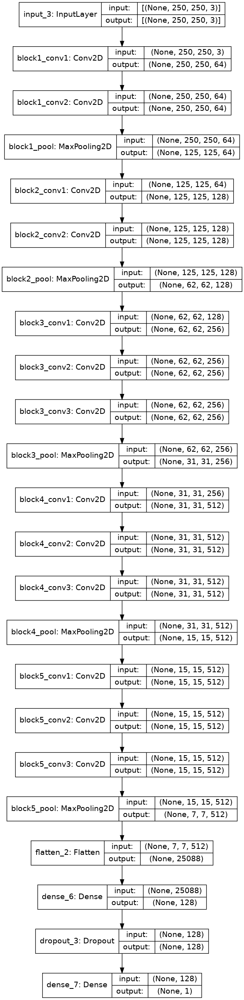

In [68]:
plot_model(CNN_vgg, show_layer_names = True , show_shapes = True)

###### Etapa 3 - Compilação e treinamento do modelo

Agora que especificamos a arquitetura do modelo, iremos compilar o modelo para treinamento. Para isso, precisamos especificar a função de perda (o que estamos tentando minimizar), o otimizador (como queremos fazer para minimizar a perda) e a métrica (como julgaremos o desempenho do modelo). Em seguida, chamaremos .fit para iniciar o treinamento do processo.

Parâmetros do ``compile``:

    optimizer - Otimizador que implementa o algoritmo RMSprop
    loss - Função de perda (binary_crossentropy pois só há uma saída)
    metrics - Métrica de avaliação (obs - pode ser colocado mais de um)

Paramêtros do ``fit``:

    training_data - base de dados de treinamento
    epochs - número de épocas
    validation_data - base de dados de teste
    callbacks - Utilização do EarlyStopping

In [69]:
# Compilação
CNN_vgg.compile(optimizer = RMSprop(lr = 0.0001), loss = 'binary_crossentropy',metrics = ['accuracy'])

# Inicio da contagem do tempo
start = dt.datetime.now()

# Treinamento e validação
CNN_vgg_history = CNN_vgg.fit(training_set, epochs = 250, validation_data = validation_set, callbacks = cb)

# Fim da Contagem do tempo
end = dt.datetime.now()
time_CNN_vgg = end - start
print ('\nTempo de treinamento e validação: ', time_CNN_vgg)

Epoch 1/250
38/38 [==============================] - 232s 6s/step - loss: 0.6391 - accuracy: 0.7107 - val_loss: 0.2654 - val_accuracy: 0.8618
Epoch 2/250
38/38 [==============================] - 201s 5s/step - loss: 0.3810 - accuracy: 0.8641 - val_loss: 0.1959 - val_accuracy: 0.9211
Epoch 3/250
38/38 [==============================] - 201s 5s/step - loss: 0.1836 - accuracy: 0.9210 - val_loss: 0.1896 - val_accuracy: 0.9145
Epoch 4/250
38/38 [==============================] - 201s 5s/step - loss: 0.1487 - accuracy: 0.9362 - val_loss: 0.2341 - val_accuracy: 0.8849
Epoch 5/250
38/38 [==============================] - 201s 5s/step - loss: 0.1427 - accuracy: 0.9471 - val_loss: 0.1315 - val_accuracy: 0.9572
Epoch 6/250
38/38 [==============================] - 201s 5s/step - loss: 0.1205 - accuracy: 0.9572 - val_loss: 0.1224 - val_accuracy: 0.9605
Epoch 7/250
38/38 [==============================] - 201s 5s/step - loss: 0.1158 - accuracy: 0.9512 - val_loss: 0.1127 - val_accuracy: 0.9539
Epoch 

###### Etapa 4 - Histórico do treinamento do modelo

Podemos observar como a precisão melhora com o tempo, eventualmente se estabilizando. Correspondentemente, a perda diminui com o tempo. Parcelas como essas podem ajudar a diagnosticar o sobreajuste. Se tivéssemos visto uma curva ascendente na perda de validação com o passar do tempo (uma forma de U no gráfico), suspeitaríamos que o modelo estava começando a memorizar o conjunto de teste e não generalizaria bem para novos dados.

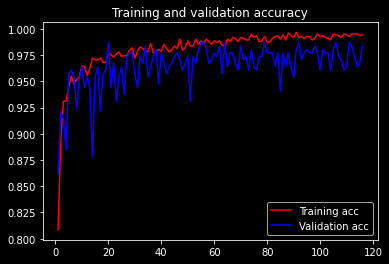

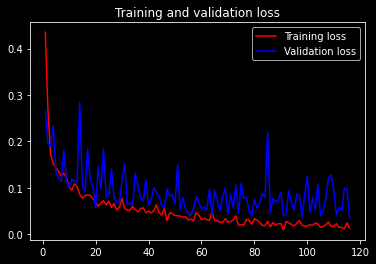

In [70]:
acc = CNN_vgg_history.history['accuracy']
val_acc = CNN_vgg_history.history['val_accuracy']
loss = CNN_vgg_history.history['loss']
val_loss = CNN_vgg_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')

plt.legend()

plt.show()

###### Etapa 5 - Gerando resultados para visualizarmos posteriormente

Conjunto de dados testset1

In [71]:
score_vgg1 = CNN_vgg.evaluate(test_set1)
print("Test Loss:", score_vgg1[0])
print("Test Accuracy:", score_vgg1[1])

12/12 [==============================] - 68s 6s/step - loss: 0.6276 - accuracy: 0.9184
Test Loss: 0.6275926828384399
Test Accuracy: 0.9184210300445557


In [72]:
y_pred_vgg1 = CNN_vgg.predict(test_set1)
y_pred_vgg1 = np.round(y_pred_vgg1)

recall_vgg1 = recall_score(y_test1, y_pred_vgg1)
precision_vgg1 = precision_score(y_test1, y_pred_vgg1)
f1_vgg1 = f1_score(y_test1, y_pred_vgg1)
roc_vgg1 = roc_auc_score(y_test1, y_pred_vgg1)

Conjunto de dados testset2

In [73]:
score_vgg2 = CNN_vgg.evaluate(test_set2)
print("Test Loss:", score_vgg2[0])
print("Test Accuracy:", score_vgg2[1])

32/32 [==============================] - 136s 4s/step - loss: 0.6452 - accuracy: 0.8507
Test Loss: 0.6452214121818542
Test Accuracy: 0.8507013916969299


In [74]:
y_pred_vgg2 = CNN_vgg.predict(test_set2)
y_pred_vgg2 = np.round(y_pred_vgg2)

recall_vgg2 = recall_score(y_test2, y_pred_vgg2)
precision_vgg2 = precision_score(y_test2, y_pred_vgg2)
f1_vgg2 = f1_score(y_test2, y_pred_vgg2)
roc_vgg2 = roc_auc_score(y_test2, y_pred_vgg2)

Salvando o modelo

In [75]:
modelFileName = 'fire_classifier_model-vgg.h5'
CNN_vgg.save(modelFileName)
print('model saved as', modelFileName)

model saved as fire_classifier_model-vgg.h5


## 12. Construção do quinto modelo (MobileNet)

O modelo [MobileNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/MobileNet) proposto por Howard et al. (2017), é uma arquitetura de CNN que foram criados para a executação de tarefas de visão computacional em dispositivos móveis e sistemas embarcados. Eles são baseados em operações de convolução separáveis em profundidade, que diminui o ônus das operações nas primeiras camadas.

<p><img src = "https://nitheshsinghsanjay.github.io/images/mobtiny_fig.PNG" alt></p>

###### Etapa 1 - Criação do modelo base

    input_shape - Definição da altura/largura e canais RGB (250, 250, 3)
    include_top - A camada totalmente conectada não vai ser incluida no topo
    weights - Pré-treinamento utilizando imagenet

In [76]:
CNN_base_mobilenet = MobileNet(input_shape = (250, 250, 3), include_top = False, weights = 'imagenet')

17227776/17225924 [==============================] - 0s 0us/step


In [77]:
for layer in CNN_base_mobilenet.layers:
    layer.trainable = False

###### Etapa 2 - Redes Neurais Densas

Parâmetros da ``RNA``:

    Dense - Todos os neurônios conectados
    units - Quantidade de neurônios que fazem parte da camada oculta
    activation - Função de ativação que será inserida
    Dropout - é usado para diminuir a chance de overfitting (40% dos neurônios de entrada são zerados)

In [78]:
CNN_mobilenet = Sequential()
CNN_mobilenet.add(BatchNormalization(input_shape = (250, 250, 3)))
CNN_mobilenet.add(CNN_base_mobilenet)
CNN_mobilenet.add(BatchNormalization())
CNN_mobilenet.add(GlobalAveragePooling2D())
CNN_mobilenet.add(Dropout(0.5))
CNN_mobilenet.add(Dense(1, activation = 'sigmoid' ))

CNN_mobilenet.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_98 (Batc (None, 250, 250, 3)       12        
_________________________________________________________________
mobilenet_1.00_224 (Function (None, 7, 7, 1024)        3228864   
_________________________________________________________________
batch_normalization_99 (Batc (None, 7, 7, 1024)        4096      
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1024)              0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 1025      
Total params: 3,233,997
Trainable params: 3,079
Non-trainable params: 3,230,918
________________________________________

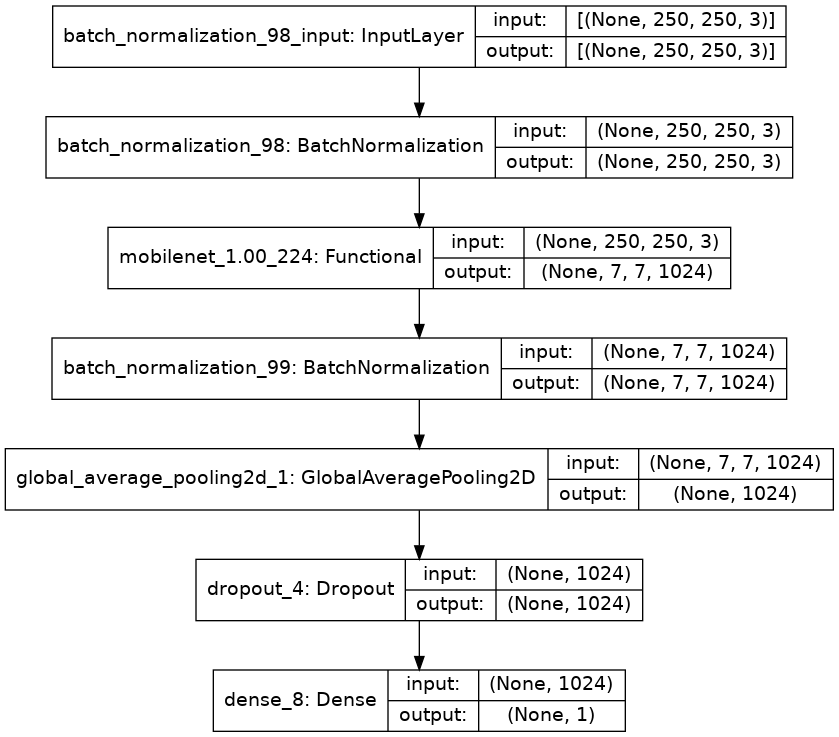

In [79]:
plot_model(CNN_mobilenet, show_layer_names = True , show_shapes = True)

###### Etapa 3 - Compilação e treinamento do modelo

Agora que especificamos a arquitetura do modelo, iremos compilar o modelo para treinamento. Para isso, precisamos especificar a função de perda (o que estamos tentando minimizar), o otimizador (como queremos fazer para minimizar a perda) e a métrica (como julgaremos o desempenho do modelo). Em seguida, chamaremos .fit para iniciar o treinamento do processo.

Parâmetros do ``compile``:

    optimizer - Otimizador que implementa o algoritmo RMSprop
    loss - Função de perda (binary_crossentropy pois só há uma saída)
    metrics - Métrica de avaliação (obs - pode ser colocado mais de um)

Paramêtros do ``fit``:

    training_data - base de dados de treinamento
    epochs - número de épocas
    validation_data - base de dados de teste
    callbacks - Utilização do EarlyStopping

In [80]:
# Compilação
CNN_mobilenet.compile(optimizer='adam',loss = 'binary_crossentropy', metrics=['accuracy'])

# Inicio da contagem do tempo
start = dt.datetime.now()

# Treinamento e validação
CNN_mobilenet_history = CNN_mobilenet.fit(training_set, epochs = 250, validation_data = validation_set, callbacks = cb)

# Fim da Contagem do tempo
end = dt.datetime.now()
time_CNN_mobilenet = end - start
print ('\nTempo de treinamento e validação: ', time_CNN_mobilenet)

Epoch 1/250
38/38 [==============================] - 22s 534ms/step - loss: 0.5814 - accuracy: 0.6801 - val_loss: 0.2098 - val_accuracy: 0.9572
Epoch 2/250
38/38 [==============================] - 20s 518ms/step - loss: 0.2211 - accuracy: 0.9332 - val_loss: 0.1271 - val_accuracy: 0.9671
Epoch 3/250
38/38 [==============================] - 19s 509ms/step - loss: 0.1280 - accuracy: 0.9652 - val_loss: 0.0821 - val_accuracy: 0.9868
Epoch 4/250
38/38 [==============================] - 20s 530ms/step - loss: 0.1043 - accuracy: 0.9748 - val_loss: 0.0695 - val_accuracy: 0.9901
Epoch 5/250
38/38 [==============================] - 21s 547ms/step - loss: 0.1045 - accuracy: 0.9663 - val_loss: 0.0579 - val_accuracy: 0.9934
Epoch 6/250
38/38 [==============================] - 20s 536ms/step - loss: 0.0832 - accuracy: 0.9792 - val_loss: 0.0466 - val_accuracy: 0.9934
Epoch 7/250
38/38 [==============================] - 21s 550ms/step - loss: 0.0680 - accuracy: 0.9791 - val_loss: 0.0530 - val_accuracy:

###### Etapa 4 - Histórico do treinamento do modelo

Podemos observar como a precisão melhora com o tempo, eventualmente se estabilizando. Correspondentemente, a perda diminui com o tempo. Parcelas como essas podem ajudar a diagnosticar o sobreajuste. Se tivéssemos visto uma curva ascendente na perda de validação com o passar do tempo (uma forma de U no gráfico), suspeitaríamos que o modelo estava começando a memorizar o conjunto de teste e não generalizaria bem para novos dados.

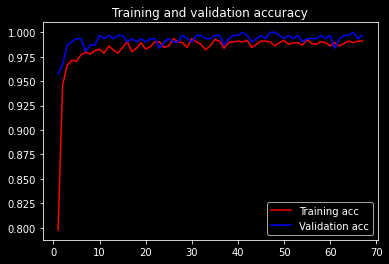

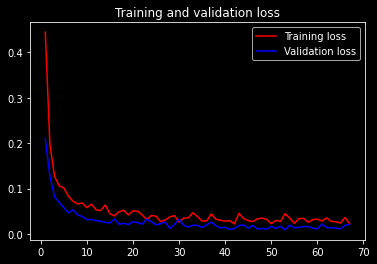

In [81]:
acc = CNN_mobilenet_history.history['accuracy']
val_acc = CNN_mobilenet_history.history['val_accuracy']
loss = CNN_mobilenet_history.history['loss']
val_loss = CNN_mobilenet_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')

plt.legend()

plt.show()

###### Etapa 5 - Gerando resultados para visualizarmos posteriormente

Conjunto de dados testset1

In [82]:
score_mn1 = CNN_mobilenet.evaluate(test_set1)
print("Test Loss:", score_mn1[0])
print("Test Accuracy:", score_mn1[1])

12/12 [==============================] - 1s 84ms/step - loss: 0.0395 - accuracy: 0.9868
Test Loss: 0.03949255496263504
Test Accuracy: 0.9868420958518982


In [83]:
y_pred_mn1 = CNN_mobilenet.predict(test_set1)
y_pred_mn1 = np.round(y_pred_mn1)

recall_mn1 = recall_score(y_test1, y_pred_mn1)
precision_mn1 = precision_score(y_test1, y_pred_mn1)
f1_mn1 = f1_score(y_test1, y_pred_mn1)
roc_mn1 = roc_auc_score(y_test1, y_pred_mn1)

Conjunto de dados testset2

In [84]:
score_mn2 = CNN_mobilenet.evaluate(test_set2)
print("Test Loss:", score_mn2[0])
print("Test Accuracy:", score_mn2[1])

32/32 [==============================] - 26s 796ms/step - loss: 0.1432 - accuracy: 0.9519
Test Loss: 0.14318925142288208
Test Accuracy: 0.9519038200378418


In [85]:
y_pred_mn2 = CNN_mobilenet.predict(test_set2)
y_pred_mn2 = np.round(y_pred_mn2)

recall_mn2 = recall_score(y_test2, y_pred_mn2)
precision_mn2 = precision_score(y_test2, y_pred_mn2)
f1_mn2 = f1_score(y_test2, y_pred_mn2)
roc_mn2 = roc_auc_score(y_test2, y_pred_mn2)

Salvando o modelo

In [86]:
modelFileName = 'fire_classifier_model-mobilenet.h5'
CNN_mobilenet.save(modelFileName)
print('model saved as', modelFileName)

model saved as fire_classifier_model-mobilenet.h5


## 13. Visualizando os resultados de todos os modelos

Treinamento

In [87]:
models= [('ConvNet', time_CNN, np.mean(CNN_model.history['accuracy']), np.mean(CNN_model.history['val_accuracy'])),
         ('Inception', time_CNN_inc, np.mean(CNN_inc_history.history['accuracy']), np.mean(CNN_inc_history.history['val_accuracy'])),
         ('Xception', time_CNN_xcep, np.mean(CNN_xcep_history.history['accuracy']), np.mean(CNN_xcep_history.history['val_accuracy'])),
         ('VGG16', time_CNN_vgg, np.mean(CNN_vgg_history.history['accuracy']), np.mean(CNN_vgg_history.history['val_accuracy'])),
         ('MobileNet', time_CNN_mobilenet, np.mean(CNN_mobilenet_history.history['accuracy']), np.mean(CNN_mobilenet_history.history['val_accuracy']))]

df_all_models = pd.DataFrame(models, columns = ['Modelo', 'Tempo', 'Acurácia Treinamento (%)', 'Acurácia Validação (%)'])

df_all_models

,Modelo,Tempo,Acurácia Treinamento (%),Acurácia Validação (%)
0,ConvNet,0 days 00:34:26.321253,0.977828,0.972662
1,Inception,0 days 00:19:58.373021,0.989538,0.981611
2,Xception,0 days 00:28:13.548959,0.993842,0.985354
3,VGG16,0 days 06:29:01.487363,0.980533,0.964496
4,MobileNet,0 days 00:22:05.670926,0.983013,0.992537


Teste 1

In [88]:
models = [('ConvNet', score_CNN1[1], recall_CNN1, precision_CNN1, f1_CNN1, roc_CNN1),
          ('Inception', score_inc1[1], recall_inc1, precision_inc1, f1_inc1, roc_inc1),
          ('Xception', score_xcep1[1], recall_xcep1, precision_xcep1, f1_xcep1, roc_xcep1),
          ('VGG16', score_vgg1[1], recall_vgg1, precision_vgg1, f1_vgg1, roc_vgg1),
          ('MobileNet', score_mn1[1], recall_mn1, precision_mn1, f1_mn1, roc_mn1)]

df_all_models_testset1 = pd.DataFrame(models, columns = ['Modelo', 'Acurácia Teste (%)', 'Recall (%)', 'Precisão (%)', 'F1 (%)', 'AUC'])

df_all_models_testset1

,Modelo,Acurácia Teste (%),Recall (%),Precisão (%),F1 (%),AUC
0,ConvNet,0.939474,0.900000,0.971591,0.934426,0.936842
1,Inception,0.978947,0.968421,0.989247,0.978723,0.978947
2,Xception,0.976316,0.978947,0.973822,0.976378,0.976316
3,VGG16,0.918421,0.957895,0.914573,0.935733,0.934211
4,MobileNet,0.986842,0.978947,0.994652,0.986737,0.986842


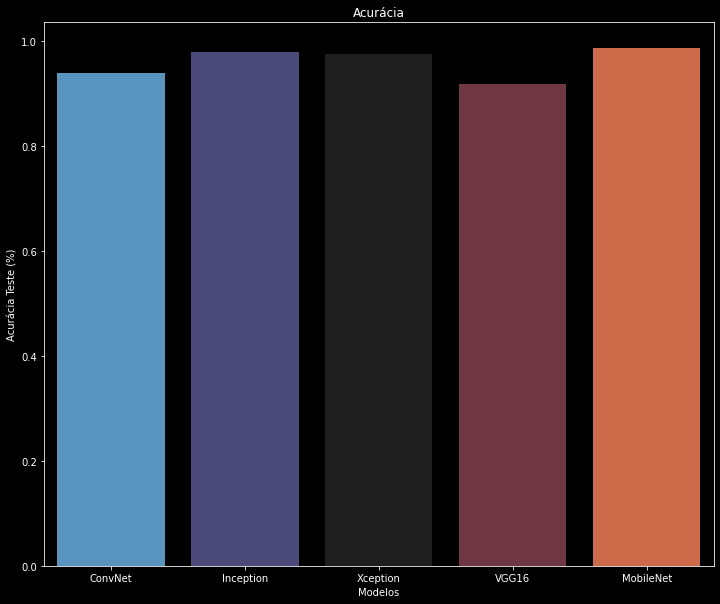

In [89]:
plt.subplots(figsize=(12, 10))
sns.barplot(y = df_all_models_testset1['Acurácia Teste (%)'], x = df_all_models_testset1['Modelo'], palette = 'icefire')
plt.xlabel("Modelos")
plt.title('Acurácia')
plt.show()

In [90]:
r_probs = [0 for _ in range(len(y_test1))]
r_auc1 = roc_auc_score(y_test1, r_probs)
r_fpr1, r_tpr1, _ = roc_curve(y_test1, r_probs)

fpr_cnn1, tpr_cnn1, _ = roc_curve(y_test1, y_pred_CNN1)
fpr_inc1, tpr_inc1, _ = roc_curve(y_test1, y_pred_inc1)
fpr_xcep1, tpr_xcep1, _ = roc_curve(y_test1, y_pred_xcep1)
fpr_vgg1, tpr_vgg1, _ = roc_curve(y_test1, y_pred_vgg1)
fpr_mn1, tpr_mn1, _ = roc_curve(y_test1, y_pred_mn1)

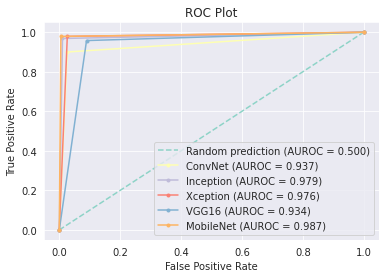

In [91]:
sns.set_style('darkgrid')

plt.plot(r_fpr1, r_tpr1, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc1)

plt.plot(fpr_cnn1, tpr_cnn1, marker='.', label='ConvNet (AUROC = %0.3f)' % roc_CNN1)
plt.plot(fpr_inc1, tpr_inc1, marker='.', label='Inception (AUROC = %0.3f)' % roc_inc1)
plt.plot(fpr_xcep1, tpr_xcep1, marker='.', label='Xception (AUROC = %0.3f)' % roc_xcep1)
plt.plot(fpr_vgg1, tpr_vgg1, marker='.', label='VGG16 (AUROC = %0.3f)' % roc_vgg1)
plt.plot(fpr_mn1, tpr_mn1, marker='.', label='MobileNet (AUROC = %0.3f)' % roc_mn1)

plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend() 
plt.show()

In [92]:
test_set1.class_indices

{'fire': 0, 'nofire': 1}

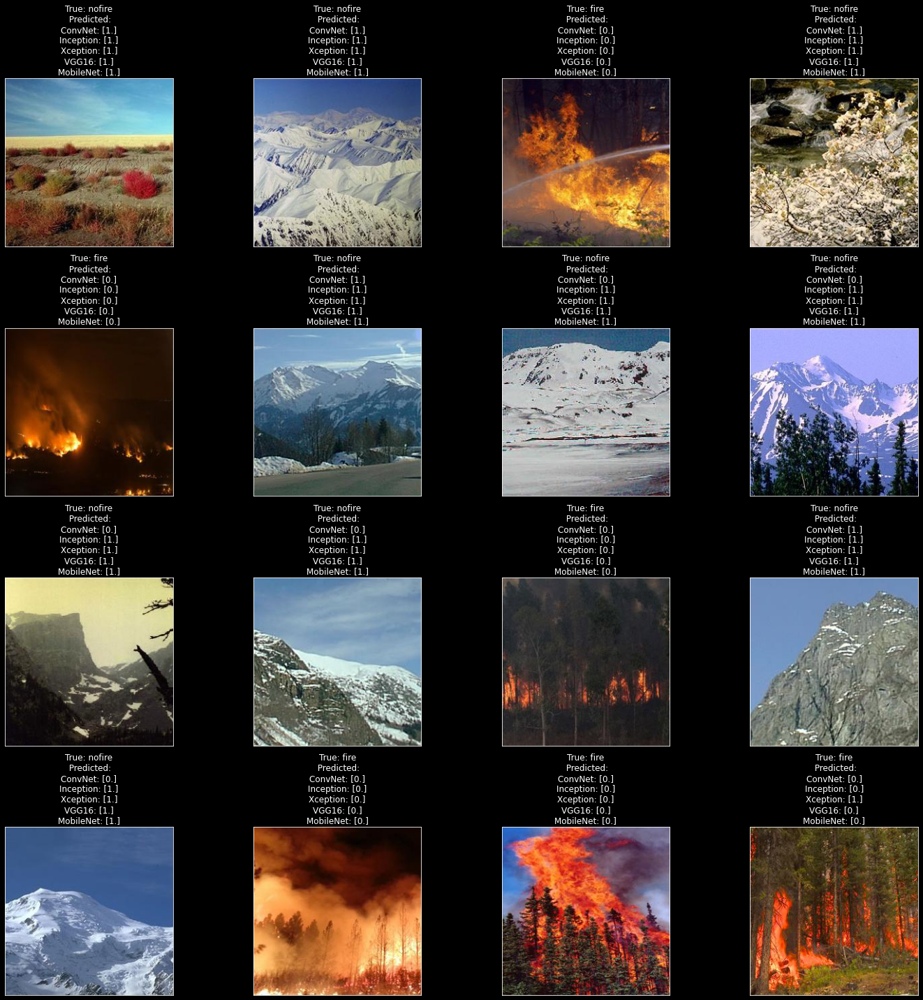

In [93]:
plt.style.use("dark_background")


fig, axes = plt.subplots(nrows = 4,
                         ncols = 4,
                         figsize = (20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(testset1_df["File"].iloc[i]))
    ax.set_title(f"True: {testset1_df.Label.iloc[i]}\n Predicted:\nConvNet: {y_pred_CNN1[i]}\nInception: {y_pred_inc1[i]}\nXception: {y_pred_xcep1[i]}\nVGG16: {y_pred_mn1[i]}\nMobileNet: {y_pred_mn1[i]}")
plt.tight_layout()
plt.show()

Teste 2

In [94]:
models = [('ConvNet', score_CNN2[1], recall_CNN2, precision_CNN2, f1_CNN2, roc_CNN2),
          ('Inception', score_inc2[1], recall_inc2, precision_inc2, f1_inc2, roc_inc2),
          ('Xception', score_xcep2[1], recall_xcep2, precision_xcep2, f1_xcep2, roc_xcep2),
          ('VGG16', score_vgg2[1], recall_vgg2, precision_vgg2, f1_vgg2, roc_vgg2),
          ('MobileNet', score_mn2[1], recall_mn2, precision_mn2, f1_mn2, roc_mn2)]

df_all_models_testset2 = pd.DataFrame(models, columns = ['Modelo', 'Acurácia Teste (%)', 'Recall (%)', 'Precisão (%)', 'F1 (%)', 'AUC'])

df_all_models_testset2

,Modelo,Acurácia Teste (%),Recall (%),Precisão (%),F1 (%),AUC
0,ConvNet,0.940882,0.872428,0.872428,0.872428,0.915684
1,Inception,0.934870,0.798354,0.923810,0.856512,0.888581
2,Xception,0.933868,0.802469,0.915493,0.855263,0.889314
3,VGG16,0.850701,0.679012,0.693277,0.686071,0.791162
4,MobileNet,0.951904,0.823045,0.975610,0.892857,0.908211


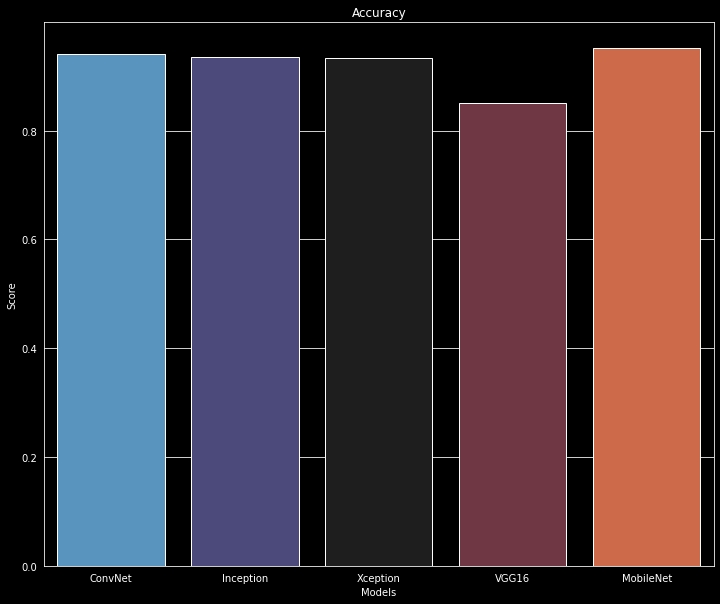

In [95]:
plt.subplots(figsize=(12, 10))
sns.barplot(y = df_all_models_testset2['Acurácia Teste (%)'], x = df_all_models_testset2['Modelo'], palette = 'icefire')
plt.xlabel("Models")
plt.ylabel("Score")
plt.title('Accuracy')
plt.show()

In [96]:
r_probs = [0 for _ in range(len(y_test2))]
r_auc2 = roc_auc_score(y_test2, r_probs)

r_fpr2, r_tpr2, _ = roc_curve(y_test2, r_probs)

fpr_cnn2, tpr_cnn2, _ = roc_curve(y_test2, y_pred_CNN2)
fpr_inc2, tpr_inc2, _ = roc_curve(y_test2, y_pred_inc2)
fpr_xcep2, tpr_xcep2, _ = roc_curve(y_test2, y_pred_xcep2)
fpr_vgg2, tpr_vgg2, _ = roc_curve(y_test2, y_pred_vgg2)
fpr_mn2, tpr_mn2, _ = roc_curve(y_test2, y_pred_mn2)

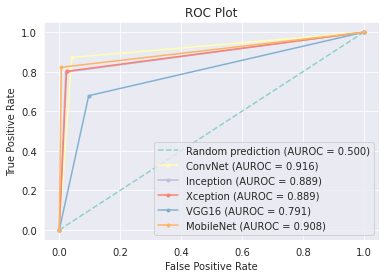

In [97]:
sns.set_style('darkgrid')

plt.plot(r_fpr2, r_tpr2, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc2)

plt.plot(fpr_cnn2, tpr_cnn2, marker='.', label='ConvNet (AUROC = %0.3f)' % roc_CNN2)
plt.plot(fpr_inc2, tpr_inc2, marker='.', label='Inception (AUROC = %0.3f)' % roc_inc2)
plt.plot(fpr_xcep2, tpr_xcep2, marker='.', label='Xception (AUROC = %0.3f)' % roc_xcep2)
plt.plot(fpr_vgg2, tpr_vgg2, marker='.', label='VGG16 (AUROC = %0.3f)' % roc_vgg2)
plt.plot(fpr_mn2, tpr_mn2, marker='.', label='MobileNet (AUROC = %0.3f)' % roc_mn2)

plt.title('ROC Plot')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend() 
plt.show()

In [98]:
test_set1.class_indices

{'fire': 0, 'nofire': 1}

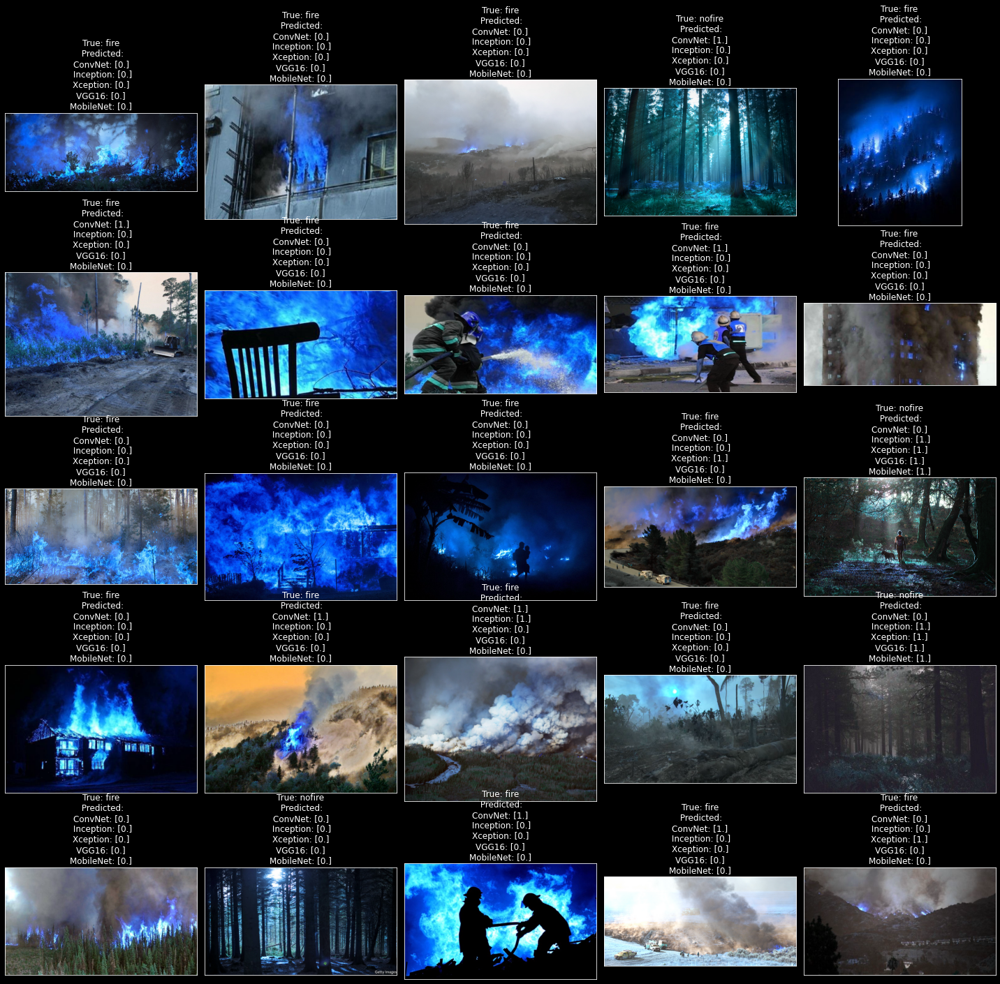

In [99]:
plt.style.use("dark_background")

fig, axes = plt.subplots(nrows = 5,
                         ncols = 5,
                         figsize = (20, 20),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(testset2_df["File"].iloc[i]))
    ax.set_title(f"True: {testset2_df.Label.iloc[i]}\n Predicted:\nConvNet: {y_pred_CNN2[i]}\n Inception: {y_pred_inc2[i]}\nXception: {y_pred_xcep2[i]}\nVGG16: {y_pred_mn2[i]}\nMobileNet: {y_pred_mn2[i]}")
plt.tight_layout()
plt.show()